# Instalando Geopandas

# Cargando los Datos de Santiago Chile

## Shape Files and Vector Maps

> The shapefile is in fact a grouping of several files formatted to represent different aspects of geodata:
* .shp — shape format; the feature geometry itself.
* .shx — shape index format; a positional index of the feature geometry to allow seeking forwards and backwards quickly.
* .dbf — attribute format; columnar attributes for each shape, in dBase IV format.

> There are also several optional files in the shapefile format. The most significant of these is the .prj file which describes the coordinate system and projection information used.

> A vector map is a group of several files, with name.shp being the main one, where the geographic features are saved. Is is important to remember that all other files as 'name.shx', ' name.dbf', etc., must be at same folder.

from  [Marcelo Rovai](https://towardsdatascience.com/mapping-geograph-data-in-python-610a963d2d7f),  follow link for full explanation.

In [9]:
import geopandas as gpd
import pandas as pd

In [2]:
map_loc = 'H:\\OneDrive - Instituto Tecnologico y de Estudios Superiores de Monterrey\\MachineLearning_Extern\\ClassContent\\Reto\\Actividades\\R13\\'
gdf = gpd.read_file(map_loc + "COMUNA_C17.shp")
#gdf

<AxesSubplot:>

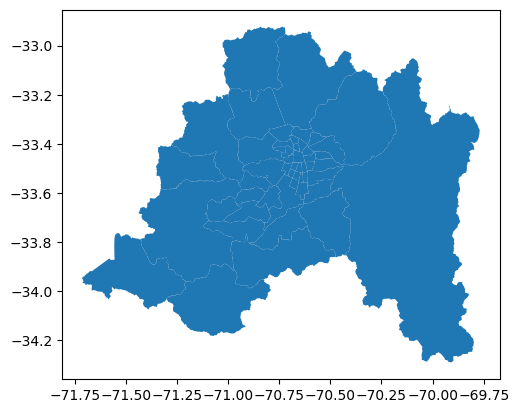

In [3]:
gdf.plot()

In [4]:
gdf.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 52 entries, 0 to 51
Data columns (total 9 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   REGION      52 non-null     object  
 1   NOM_REGION  52 non-null     object  
 2   PROVINCIA   52 non-null     object  
 3   NOM_PROVIN  52 non-null     object  
 4   COMUNA      52 non-null     object  
 5   NOM_COMUNA  52 non-null     object  
 6   SHAPE_Leng  52 non-null     float64 
 7   SHAPE_Area  52 non-null     float64 
 8   geometry    52 non-null     geometry
dtypes: float64(2), geometry(1), object(6)
memory usage: 3.8+ KB


<AxesSubplot:>

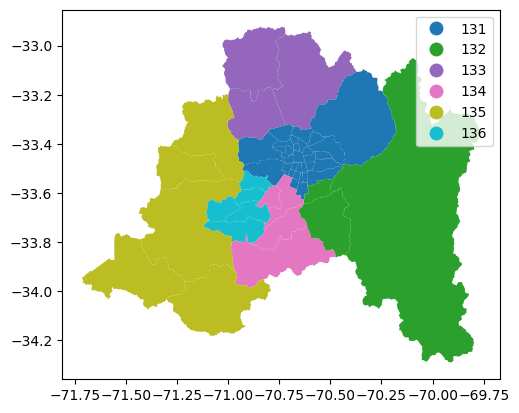

In [5]:
gdf.plot("PROVINCIA", legend = True)

<AxesSubplot:>

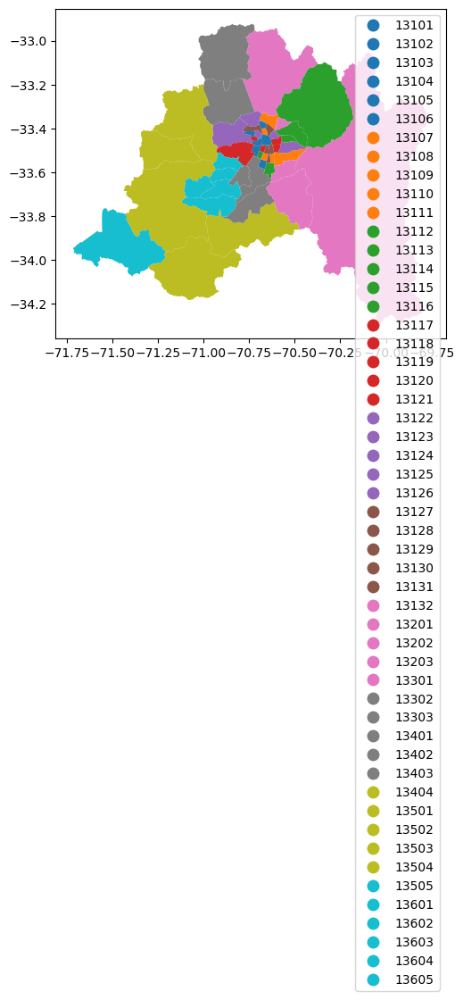

In [6]:
gdf.plot("COMUNA", legend = True)

<AxesSubplot:>

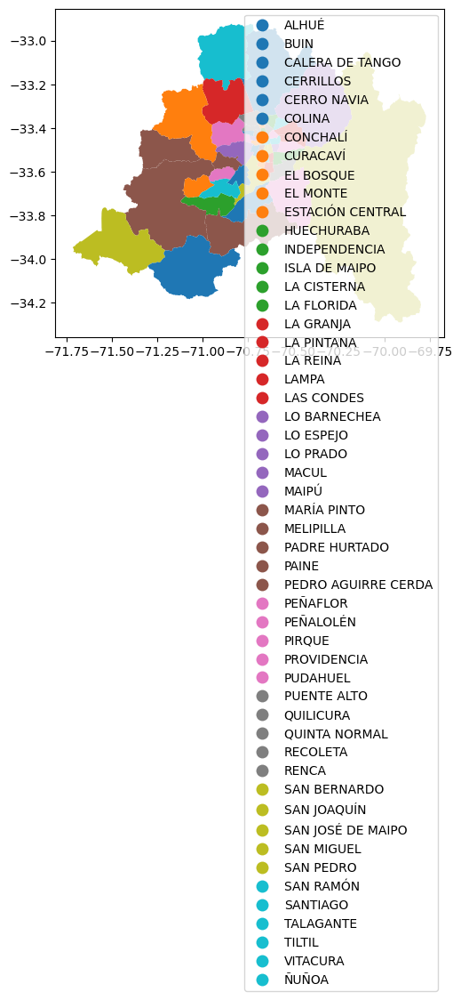

In [7]:
gdf.plot("NOM_COMUNA", legend = True)

In [11]:
gdf.explore("SHAPE_Area", legend = False)

### Juntando varios shapefiles

In [25]:
import os
import pandas as pd

# todos los shape file en la carpeta
"""
%cd ..

file = os.listdir("R13")
path = [os.path.join("R13", i) for i in file if ".shp" in i]
temp = []

[temp.append(i) for i in path if not ".xml" in i]
path = temp
"""

# solo las regiones y comunas
path = ["REGION_C17.shp", "COMUNA_C17.shp"]

In [26]:
gdf = gpd.GeoDataFrame(pd.concat([gpd.read_file(i) for i in path], 
                        ignore_index=True), crs=gpd.read_file(path[0]).crs)

gdf.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 53 entries, 0 to 52
Data columns (total 9 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   REGION      53 non-null     object  
 1   NOM_REGION  53 non-null     object  
 2   SHAPE_Leng  53 non-null     float64 
 3   SHAPE_Area  53 non-null     float64 
 4   geometry    53 non-null     geometry
 5   PROVINCIA   52 non-null     object  
 6   NOM_PROVIN  52 non-null     object  
 7   COMUNA      52 non-null     object  
 8   NOM_COMUNA  52 non-null     object  
dtypes: float64(2), geometry(1), object(6)
memory usage: 3.9+ KB


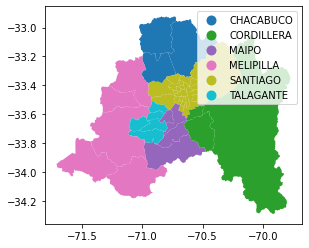

In [32]:
gdf.plot("NOM_PROVIN", legend = True)

In [12]:
gdf.explore("NOM_COMUNA", legend = True)